# Faults and Disruptions



So far we've been experimenting with a *perfect world* assumption. Although this is useful to test your systems, it doesn't suffice as a peer-to-peer network model. In this notebook we will relax this assumption, introducing distortions and faults.

In P2PSimpy distortions are modeled as a `Runner`.  

`BaseDisruption` is a base class to model periodical incidental failures and slowdowns.  It is modeled as a runner testing once per `interval` a status change. The status change is modeled as uniform random sampling with a mean time between disruption specified with `mtbf` parameter. Finally, the parameter `availability` affects the time each peer is disrupted. For example, if `availability=0.9` the peer will be not disrupted 90 % of the time.

Each inherited class must implement two functions: `disruption_start` and `disruption_end`.  
Out of the box there two classes available: `Slowdown` and `Downtime`:
- `Slowdown` - temporarily reduces bandwidth, which in turn affects the message latencies. The slowdown effect can be specified with `slowdown` parameter (from `0` to `1.0`). This class models [bandwidth throttling](https://en.wikipedia.org/wiki/Bandwidth_throttling).
- `Downtime` - temporarily deactivates the peer. This models offline status of a peer with both gracefull exit and crashes. Every connection is restored once the peer is back online.  You can read about [Fault tolerance](https://en.wikipedia.org/wiki/Fault_tolerance).

Let's repeat the previous notebook but with crashes and slowdowns.

In [89]:
# Initialize the experiment:
from p2psimpy.config import *
import networkx as nx

from p2psimpy.services.connection_manager import BaseConnectionManager
import networkx as nx

from p2psimpy.simulation import BaseSimulation

import warnings
warnings.filterwarnings('ignore')

# Load the previous experiment configurations
exper = BaseSimulation.load_experiment(expr_dir='gossip_expr')

Locations, topology, peer_services, service_impl = exper

We need to assign implementations of following services:

In [90]:
peer_services

{'client': PeerType(config=<class 'p2psimpy.config.PeerConfig'>, service_map=('BaseConnectionManager', 'MessageProducer')),
 'peer': PeerType(config=<class 'p2psimpy.config.PeerConfig'>, service_map={'BaseConnectionManager': None, 'GossipService': <class 'p2psimpy.config.GossipConfig'>})}

In [91]:
service_impl

{'BaseConnectionManager': None, 'GossipService': None, 'MessageProducer': None}

In [92]:
# We will use default services - but fill free to replace with your services 

# from p2psimpy.services.custom_gossip import GossipService
# from p2psimpy.services.custom_message_producer import MessageProducer
from p2psimpy.services.gossip import GossipService
from p2psimpy.services.message_producer import MessageProducer

class LimitedMessageProducer(MessageProducer):

    def __init__(self, *args):
        super().__init__(*args)

        self.times = 20

    def run(self):
        yield self.env.timeout(self.init_timeout)
        for _ in range(self.times):
            self.produce_transaction()
            yield self.env.timeout(self.tx_interval)
            

service_impl['BaseConnectionManager'] = BaseConnectionManager
service_impl['MessageProducer'] = LimitedMessageProducer
service_impl['GossipService'] = GossipService

## Adding random crashes

There are two options on how to model downtime, crashes and disruptions: 
 - Scheduled disruptions 
 - Random disruptions 

*Scheduled disruptions* is a runner with a list of timeouts. For example, `schedule = [100, 200, 100, 300]`, will run first disruption at the time `100`, and it will be disrupted until time `300`, next disruption starts at time `400` and ends at the time `700`.     

*Random disruptions* will insert disruptions modeled with a statistical distribution. 
There are three parameters that need to be filled, i.e., `start_time, disruption_time, disruption_intervals`. `disruption_time` models time of a disruption, `disruption_invervals` is the time between disruptions, `start_time` is an initial delay to start disruptions. Each of attributes can be one of three types: 
 - Constant value - in this case all peer will get the same value. For example, with `start_time = 100` every peer with this configuration will be delayed by `100 ms`; 
 - `Dist` object: in this case every peer be initialized with a random value with a given distribution. For example, with `start_time=Dist('norm', (100, 20))` peers will sample one value from the normal distribution with an average 100 and the standard deviation of 10 ([documentation](https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.norm.html#scipy.stats.norm));
 - `DistAttr` object: every peer will get the distribution itself. In this case service can use value that will change dynamically. For example, `start_time=DistAttr('norm', (100, 20))` every peer will get a value = `Dist('norm', (100, 20))`.  

Let's use `DistAttr` object to model `RandomDowntime`:

In [93]:
print(peer_services['client'].service_map)

('BaseConnectionManager', 'MessageProducer')


In [94]:
from p2psimpy.services.disruption import RandomDowntime

class DowntimeConfig(Config):
    start_time = DistAttr('norm', (1500, 200))
    disruption_time = DistAttr('norm', (800, 200))
    disruption_intervals = DistAttr('norm', (200, 100))

peer_services['peer'].service_map[RandomDowntime] = DowntimeConfig

# Visualizing peers connections 

Let's see how model would execute connections/disconnections with a simple animation. When peer is disconnected it's color will turn red and all edges will not be displayed. 

In [95]:
!pip install pygraphviz

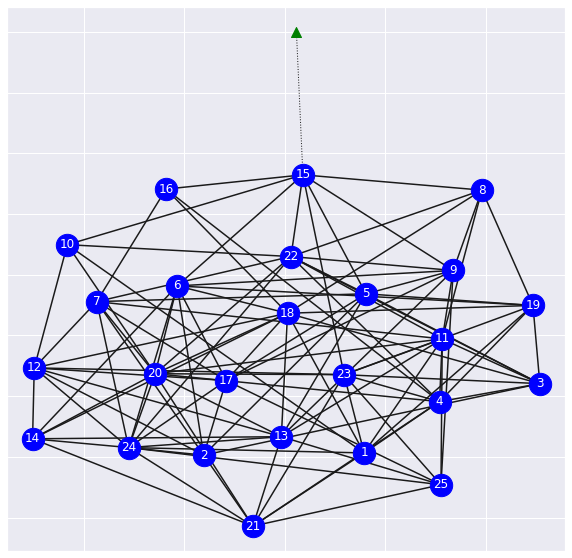

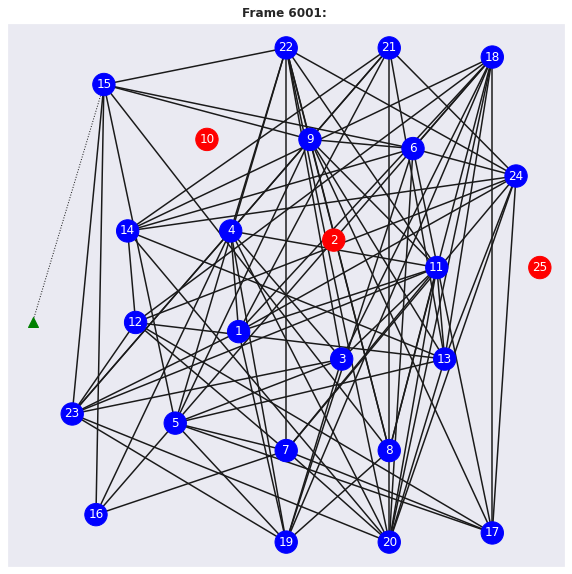

In [96]:
import networkx as nx
import matplotlib.pyplot as plt
import matplotlib.animation
from networkx.drawing.nx_pydot import graphviz_layout
import seaborn as sns
from IPython.display import HTML

sns.set()

def visalize_graph(G, ax=None):
    master_nodes = [n for (n,ty) in \
    nx.get_node_attributes(G,'type').items() if ty == 'peer']
    client_nodes = [n for (n,ty) in \
        nx.get_node_attributes(G,'type').items() if ty == 'client']
    online_map = {n:ty for (n,ty) in nx.get_node_attributes(G,'is_online').items()}
    
    colors = ['blue' if online_map[k] else 'red' for k in master_nodes]
    
    nx.draw_networkx_nodes(G, pos, nodelist=master_nodes, \
        node_color=colors, node_shape='o', node_size=500, ax=ax)
    nx.draw_networkx_nodes(G, pos, nodelist=client_nodes,  \
        node_color='green', node_shape='^', node_size=100, label=1, ax=ax)
    nx.draw_networkx_labels(G, pos, labels={k:k for k in master_nodes}, font_color='w', ax=ax)
    
    nx.draw_networkx_edges(G, pos, edgelist=G.subgraph(master_nodes).edges(), width=1.5, ax=ax)
    nx.draw_networkx_edges(G, pos, edgelist=G.edges(nbunch=client_nodes),  style='dotted', ax=ax)

def visualize_peer_client_network(G):
    plt.figure(figsize=(10,10))

    # Draw client/ peer network 

    master_nodes = [n for (n,ty) in \
        nx.get_node_attributes(G,'type').items() if ty == 'peer']
    client_nodes = [n for (n,ty) in \
        nx.get_node_attributes(G,'type').items() if ty == 'client']

    pos = nx.kamada_kawai_layout(G)

    nx.draw_networkx_nodes(G, pos, nodelist=master_nodes, \
        node_color='blue', node_shape='o', node_size=500)
    nx.draw_networkx_nodes(G, pos, nodelist=client_nodes,  \
        node_color='green', node_shape='^', node_size=100, label=1)

    nx.draw_networkx_labels(G, pos, labels={k:k for k in master_nodes}, font_color='w')

    nx.draw_networkx_edges(G, pos, edgelist=G.subgraph(master_nodes).edges(), width=1.5)
    nx.draw_networkx_edges(G, pos, edgelist=G.edges(nbunch=client_nodes),  style='dotted')

# Init Graph
sim = BaseSimulation(Locations, topology, peer_services, service_impl, seed=42)
G = sim.get_graph()
visualize_peer_client_network(topology)
pos = graphviz_layout(G)

# Build plot
fig, ax = plt.subplots(figsize=(10,10))

def update(num):
    if num !=0:
        sim.run(num)
    G = sim.get_graph()

    ax.clear()
    visalize_graph(G, ax)
    # Scale plot ax
    ax.set_title("Frame %d: "%(num+1), fontweight="bold")
    ax.set_xticks([])
    ax.set_yticks([])


ani = matplotlib.animation.FuncAnimation(fig, update, frames=range(0, 6100, 100))
HTML(ani.to_jshtml())

In [97]:
import pandas as pd

def total_delay(sim, peer_id, storage_name):
    store = sim.peers[peer_id].get_storage(storage_name).txs
    for k, peer_time in store.items():
        client_id, msg_num = k.split('_')
        client_id = int(client_id)
        msg_num = int(msg_num)
        client_time = sim.peers[client_id].storage[storage_name].txs[k]
        yield (int(msg_num), peer_time - client_time)
        
def get_gossip_table(sim, storage_name):
    return pd.DataFrame({k: dict(total_delay(sim, k, storage_name)) 
                         for k in sim.types_peers['peer']}).sort_index()

sim = BaseSimulation(Locations, topology, peer_services, service_impl, seed=42)
sim.run(15_000)
df = get_gossip_table(sim, 'msg_time')
df

,1,2,3,4,5,6,7,8,9,10,...,16,17,18,19,20,21,22,23,24,25
1,131.487139,140.126916,132.149049,103.725546,103.510309,103.482060,103.189532,66.509995,140.098445,131.263910,...,66.362977,67.978365,66.852670,66.993659,141.452221,141.098923,103.422368,131.751541,131.830869,178.191611
2,131.270313,139.621341,180.567397,209.013248,102.831960,102.368534,103.167776,140.351329,140.229385,131.543020,...,NaN,140.287130,139.494754,139.340529,139.028819,196.674449,102.595809,131.020656,181.153289,175.817342
3,181.310215,138.488488,132.630838,102.298161,102.555991,104.015426,102.051287,245.983059,65.999740,181.431499,...,65.975056,139.290412,66.535463,67.028853,67.011438,139.992199,102.316945,131.247504,203.962456,102.973943
4,131.281545,197.557533,262.294067,175.058398,232.836669,101.156538,174.262838,245.173664,244.677915,131.028204,...,NaN,245.196752,196.927014,196.336761,137.995034,196.374970,233.377687,130.899523,131.556095,208.916096
5,NaN,NaN,130.937598,NaN,101.946097,177.095951,102.273623,139.357456,139.837981,180.469830,...,NaN,140.114527,139.844062,138.870449,138.691129,139.168084,102.476055,130.689709,180.283827,103.361036
7,180.084299,213.997450,180.690152,102.109023,176.971995,NaN,258.368387,65.813632,139.789848,179.855207,...,138.527844,NaN,140.350337,66.280808,138.735071,NaN,101.856380,205.371734,NaN,176.225931
8,131.750721,246.406992,180.960555,176.903673,103.145313,259.402447,103.407047,66.128743,NaN,NaN,...,140.191700,139.935814,246.790912,NaN,NaN,197.318554,102.942894,132.070871,132.011169,209.487210
9,181.149695,246.210043,180.727681,102.703352,NaN,177.249800,102.531708,246.020115,NaN,180.859824,...,65.877797,245.763979,66.337170,NaN,66.811896,246.100747,102.430692,180.708672,132.307482,102.924943
10,131.564117,NaN,132.203415,209.495813,NaN,NaN,NaN,65.946152,67.449574,287.274235,...,65.946165,66.905476,66.414948,66.411786,197.497138,NaN,102.710814,131.816401,132.239295,NaN
11,132.368589,NaN,180.634172,175.881975,102.911148,103.045103,103.870215,66.357156,65.892677,132.520208,...,NaN,66.411920,66.825709,140.315809,139.146182,139.645060,102.644561,NaN,181.083067,175.156823


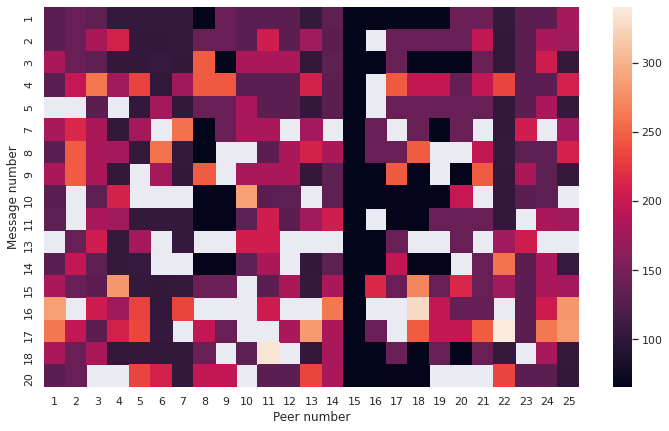

In [98]:
import seaborn as sns
sns.set()

def show_heat_map(df):
    plt.figure(figsize=(12, 7))
    ax = plt.axes()

    sns.heatmap(df, ax=ax)

    plt.xlabel('Peer number', fontsize = 12) # x-axis label with fontsize 15
    plt.ylabel('Message number', fontsize = 12) # y-axis label with fontsize 15

    plt.show()

show_heat_map(df)

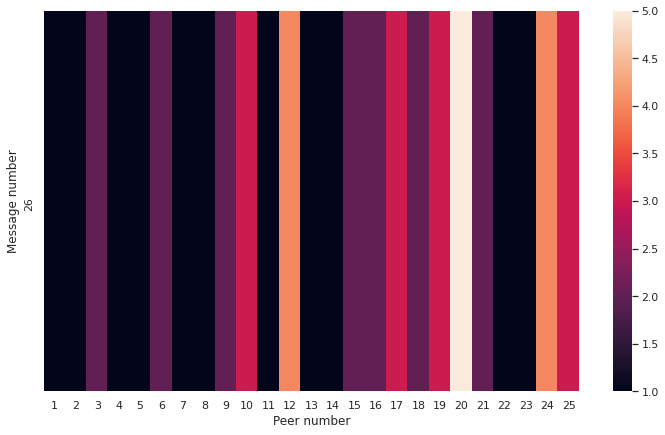

In [99]:
# Show average overhead on message

def calc_overhead(sim, peer_id, storage_name):
    store = sim.peers[peer_id].storage[storage_name].times_seen
    for k, times in store.items():
        msg_num, client_id = k.split('_')
        yield (int(msg_num), int(times))
    
def get_overhead_table(sim, storage_name):
    return pd.DataFrame({k: dict(calc_overhead(sim, k, storage_name)) 
                         for k in sim.types_peers['peer']}).sort_index()

def show_overhead_hist(overhead_table):
    plt.figure(figsize=(10, 6))
    sns.distplot(overhead_table, norm_hist=True)
    plt.xlabel('Overhead (message seen by same peer)', fontsize=15)

def get_monitor_time_table(sim, data='bytes'):
    if data == 'bytes':
        data_func = lambda x: x.bytes_load  
    elif data == 'msg_count':
        data_func = lambda x: x.msg_count_load  

    return pd.DataFrame({k: data_func(sim.peers[k])
                         for k in sim.types_peers['peer']}).sort_index()

def show_bandwidth_time(tt_df):
    tt_df2 = tt_df\
        .stack()\
        .reset_index()\
        .rename(columns={'level_0':'time', 'level_1':'peer_id', 0: 'data'})

    plt.figure(figsize=(10,6))
    ax = sns.lineplot(x='time', y='data', data=tt_df2, 
                 ci='sd', estimator="median",)

    ax.set_title('Bandwidth overhead', fontsize= 20 )
    ax.set_xlabel('Time (s)', fontsize=12)
    tl = ax.set_ylabel('Overhead per second (bytes/sec)', fontsize=12)
    
def show_msg_count_time(tt_df):
    tt_df2 = tt_df\
        .stack()\
        .reset_index()\
        .rename(columns={'level_0':'time', 'level_1':'peer_id', 0: 'data'})

    plt.figure(figsize=(10,6))
    ax = sns.lineplot(x='time', y='data', data=tt_df2, 
                 ci='sd', estimator="median",)

    ax.set_title('Msg count overhead', fontsize= 20 )
    ax.set_xlabel('Time (s)', fontsize=12)
    tl = ax.set_ylabel('Overhead per second (count/sec)', fontsize=12)


oh = get_overhead_table(sim, 'msg_time')
show_heat_map(oh)            

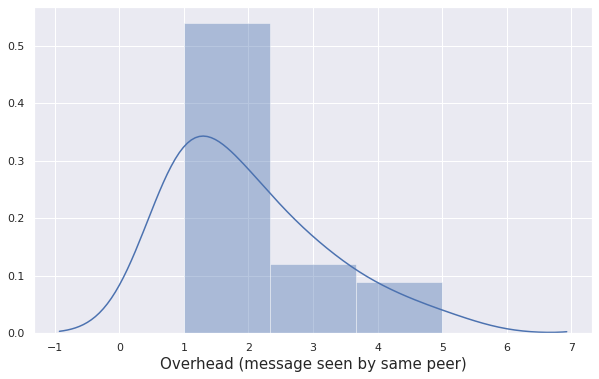

In [100]:
show_overhead_hist(oh)

## Workload overhead per second

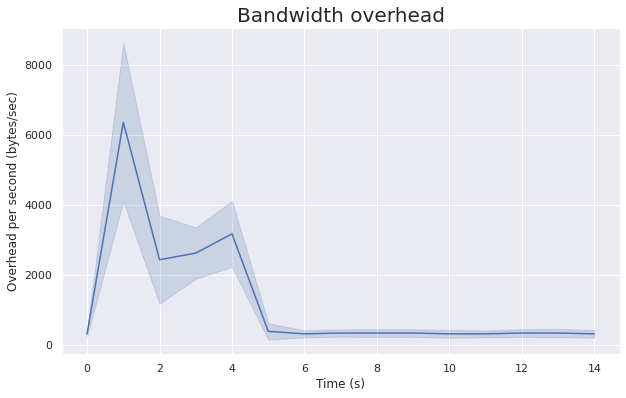

In [101]:
bw_oh_tt = get_monitor_time_table(sim)
show_bandwidth_time(bw_oh_tt)

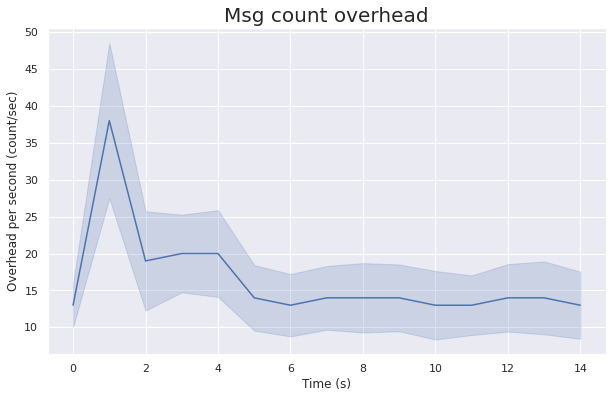

In [102]:
mc_oh_tt = get_monitor_time_table(sim, data='msg_count')
show_msg_count_time(mc_oh_tt)

As you can see not all peers now get the message. This is because some peers might be offline at the moment of disseminating the message. This can lead to the message loss.

One of the most critical failures is the failure of a peer directly connected to the client.  

Here are some common ways to ensure that client will be connected and message won't be lost:
- Client must be connected to multiple peers chosen from a diverse group of peers. This minimize the probability that client is connected to a faulty or malicious peer.
- Message should have some meta-data indicators to quickly make sense what is missing. Additionally, if message is depended upon previous messages it includes reference pointers. The simplest index is a *client message counter*. Peer can easily identify if they are missing some messages by going through the range. 
- To ensure *"eventual consistency"* [TODO add link] peer needs to periodically synchronize the data with each other. Example of such a process is sometimes called *set reconciliation*, *anti-entropy*. This commonly used in *AP* databases [TODO add link]. 



# More client connections!


In [103]:
from random import sample

num_cons = 5 # connect to 5 peers 

for c in sim.types_peers['client']:
    for p in sample(list(sim.types_peers['peer']), num_cons):
        topology.add_edge(c, p)

# Gossip with periodical synchronization 


Let's ensure that all the peers will eventually receive all data from a client. First, we will connect `client` to multiple peers. Second, we will replace simple gossip with a pull based gossip. Pull-based gossip is based on periodical synchronization by exchanging views with their direct neighbors. 



In [104]:
from p2psimpy.services.gossip import PullGossipService, RangedPullGossipService

service_impl['GossipService'] = RangedPullGossipService

sim_pull = BaseSimulation(Locations, topology, peer_services, service_impl)
sim_pull.run(15_000)

## Average receive time

In [105]:
df_pl = get_gossip_table(sim_pull, 'msg_time')
df_pl

,1,2,3,4,5,6,7,8,9,10,...,16,17,18,19,20,21,22,23,24,25
1,482.706616,408.126994,651.779149,482.720732,65.394357,542.771083,174.969004,352.355667,304.043081,165.926715,...,249.167098,114.242411,824.361283,482.657932,249.519490,229.063259,65.501596,306.522586,77.949671,78.040086
2,565.757920,649.292481,451.779149,326.663758,65.452869,410.822663,224.197514,316.427943,604.034215,466.089372,...,195.937900,414.316258,624.361283,716.627372,220.330529,474.931770,65.544172,251.464586,77.933908,77.948296
3,507.373038,560.601263,396.880719,626.719354,65.433214,538.602828,274.814873,614.888993,404.034215,266.089372,...,349.496757,359.321084,424.361283,516.627372,373.886330,274.931770,65.297596,329.133456,78.001531,78.015589
4,752.427767,360.829118,196.880719,426.719354,65.517063,338.602828,181.141067,414.888993,703.859011,566.112845,...,253.765265,514.177546,224.361283,316.627372,174.106733,149.658189,65.645955,129.133456,77.964289,78.029573
5,1296.247968,1131.166883,996.891850,1182.104166,65.438815,607.840231,981.064873,214.888993,631.550810,366.112845,...,554.211928,314.177546,670.047159,680.978546,474.056480,450.184761,65.560944,506.393001,78.033547,77.959176
6,1096.247968,931.166883,796.891850,982.104166,65.499124,407.840231,781.064873,1015.510521,431.550810,166.112845,...,354.211928,114.177546,470.047159,480.978546,274.056480,250.184761,65.596235,306.393001,77.924279,78.050851
7,896.247968,731.166883,596.891850,826.813224,65.392958,842.898846,581.064873,815.510521,653.955195,965.933281,...,652.285309,414.287823,771.487233,636.461809,1232.189597,549.732086,536.158495,606.318742,78.001430,78.029273
8,696.247968,531.166883,396.891850,676.955144,65.614413,710.395540,389.664206,615.510521,1449.251295,765.933281,...,494.920755,1859.802799,959.947888,436.461809,1032.189597,929.213676,336.158495,1051.107920,928.887433,1349.626467
9,496.247968,549.586560,196.891850,426.813224,136.668193,510.395540,181.064873,415.510521,1249.251295,80.481247,...,294.920755,129.013112,724.472363,236.461809,321.598796,149.732086,65.747539,206.318742,129.111352,78.050336
10,607.012170,349.586560,998.124617,1182.105207,65.232602,310.395540,1480.949935,215.510521,1049.251295,365.933281,...,595.435605,1459.802799,1024.630808,436.461029,974.139956,375.046228,65.447179,449.523940,77.903410,78.057104


As you can see it takes more time on average to reach a peer, namely: 

In [106]:
change = df_pl.mean().mean()/ df.mean().mean()
change 

3.7615706705754803

## Overhead

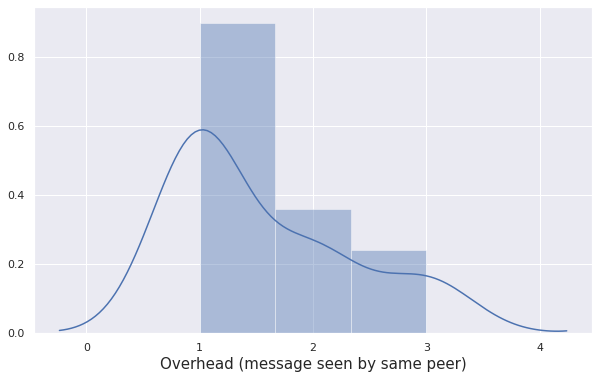

In [107]:
oh_pl = get_overhead_table(sim_pull, 'msg_time')
show_overhead_hist(oh_pl)

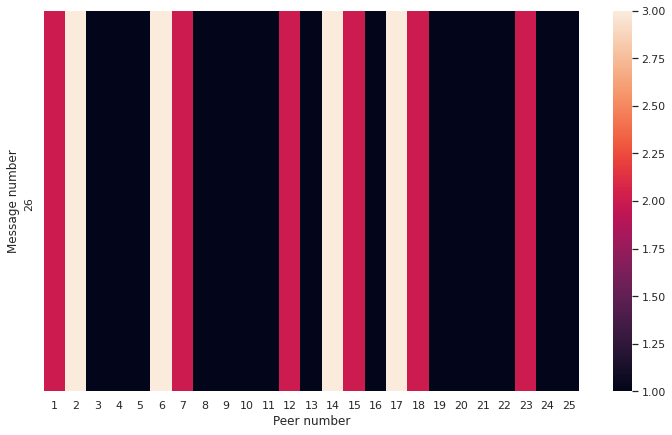

In [108]:
show_heat_map(oh_pl)

### Overhead over time

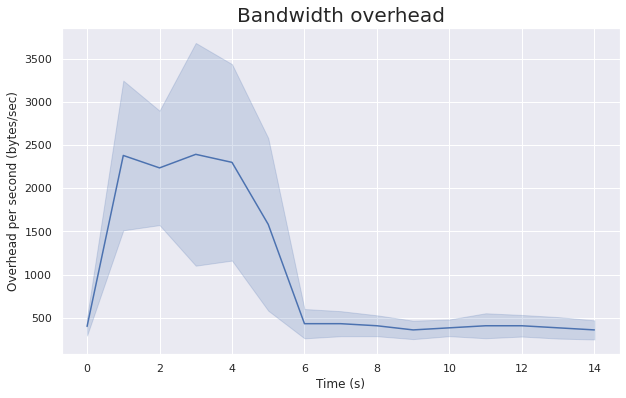

In [109]:
bw_oh_tt_pull = get_monitor_time_table(sim_pull)
show_bandwidth_time(bw_oh_tt_pull)

In [110]:
bw_oh_tt_pull.mean(axis=1).mean() / bw_oh_tt.mean(axis=1).mean() 

0.8388923277821118

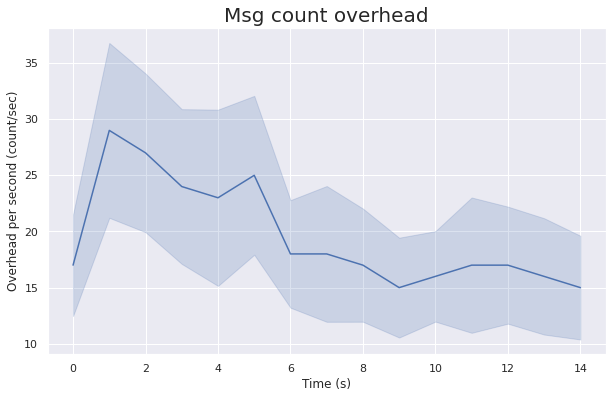

In [111]:
mc_oh_tt_pull = get_monitor_time_table(sim_pull, data='msg_count')
show_msg_count_time(mc_oh_tt_pull)

In [112]:
mc_oh_tt_pull.mean(axis=1).mean() / mc_oh_tt.mean(axis=1).mean() 

1.1779268487462065

Pull based gossip takes more time to converge on average, but enjoys a lesser overhead. 

The main ideas of such gossip is to periodically exchange indices of messages instead of messages itself. When peers discover that some messages are missing (by inspecting received indexes) they request missing messages by their indices. This approach saves bandwidth and generally achieves higher throughput (msg per second) with a trade-off of latency.   


In [113]:
sim_pull.save_experiment(expr_dir='crash_gossip', include_module_classes=True)

# More experiments 

Test your gossip from the previous notebook. How good it can handle periodical outages? 

Try different topologies? Will the gossip work for all the topologies? 

Report your findings here:


{'client': PeerType(config=<class 'p2psimpy.config.PeerConfig'>, service_map={'BaseConnectionManager': None, 'MessageProducer': <class 'p2psimpy.config.ClientMsgProducerConfig'>}),
 'peer': PeerType(config=<class 'p2psimpy.config.PeerConfig'>, service_map={'BaseConnectionManager': None, 'GossipService': <class 'p2psimpy.config.GossipConfig'>, <class 'p2psimpy.services.disruption.RandomDowntime'>: <class '__main__.DowntimeConfig'>})}

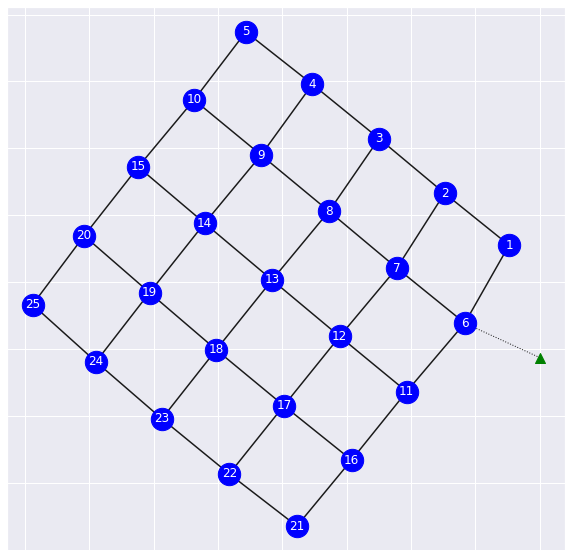

In [122]:
# Here, we compare above Pull-based gossip and Push-based (ttl and fanout) gossip protocol for our custom topology, i.e. 2D-Grid topology
import pandas as pd

from p2psimpy.services.custom_gossip import GossipService
from p2psimpy.services.custom_message_producer import MessageProducer

# Load the previous experiment configurations
exper = BaseSimulation.load_experiment(expr_dir='gossip_expr_custom')

Locations, topology, peer_services, service_impl = exper

service_impl['BaseConnectionManager'] = BaseConnectionManager
service_impl['MessageProducer'] = MessageProducer
service_impl['GossipService'] = GossipService
peer_services['peer'].service_map[RandomDowntime] = DowntimeConfig

visualize_peer_client_network(topology)
peer_services

In [123]:
sim_custom = BaseSimulation(Locations, topology, peer_services, service_impl)
sim_custom.run(15_000)

In [124]:
def total_delay(sim, peer_id, storage_name):
    store = sim.peers[peer_id].storage[storage_name].txs
    for k, peer_time in store.items():
        msg_num, client_id = k.split('_')
        client_time = sim.peers[int(client_id)].storage[storage_name].txs[msg_num]
        yield (int(msg_num), peer_time - client_time)
        
def get_gossip_table(sim, storage_name):
    return pd.DataFrame({k: dict(total_delay(sim, k, storage_name)) 
                         for k in sim.types_peers['peer']}).sort_index()

df = get_gossip_table(sim_custom, 'msg_time')
df

# Note that, the client is connected to only one peer node. Therefore, some messages might be lost completely which will lead to less than 20 messages in the below table.

,1,2,3,4,5,6,7,8,9,10,...,16,17,18,19,20,21,22,23,24,25
1,36.563097,72.804888,150.824950,168.886717,206.204712,0.269888,37.027116,102.735781,168.379577,234.002488,...,0.813944,38.634409,104.119465,104.442912,170.043465,104.527146,39.144341,39.666682,104.668058,104.971264
2,36.108158,72.441653,102.381191,168.028078,204.776143,0.274978,36.855639,102.162651,167.788129,233.375670,...,276.650540,240.304056,174.968279,175.084519,NaN,306.316968,240.764042,240.621602,175.303397,NaN
3,36.702671,73.127823,151.133759,216.812125,253.650815,0.233512,37.545027,462.946816,397.263085,331.687235,...,147.582460,110.904171,NaN,177.466697,243.095379,176.691515,111.381170,111.891162,177.491209,177.743076
4,110.453000,73.047077,102.496887,167.916395,204.132751,0.229967,36.588137,102.216570,167.768027,233.408457,...,0.829418,37.889190,103.430922,103.702513,169.452762,78.886731,38.395292,38.870562,103.966046,104.337922
5,37.969070,74.334464,233.336397,167.820296,204.467323,0.250194,37.765498,101.930013,167.333011,232.786692,...,74.963032,38.046029,101.927282,102.215317,167.625431,104.223087,38.644095,39.112927,102.461681,102.872777
6,36.903402,72.160223,102.444150,168.062449,NaN,0.201637,36.730221,102.192406,167.754325,NaN,...,0.797016,37.438289,102.739282,210.873276,276.388434,78.774799,144.457150,144.947980,210.611794,210.923490
7,37.794276,74.513077,103.789762,349.233044,312.574572,0.255734,38.094720,103.532458,169.115566,234.628954,...,147.834890,110.117216,175.547307,175.967528,241.420800,176.169578,110.589880,NaN,176.239386,306.867335
8,36.741292,73.312211,103.170146,168.743872,205.899108,0.317250,37.379713,102.864058,168.531479,233.936787,...,1.033798,38.086441,103.304739,103.455168,169.067267,79.043744,38.569376,NaN,103.717845,103.959460
9,NaN,NaN,NaN,170.173660,NaN,0.287329,NaN,NaN,169.649873,235.201724,...,0.827848,38.139769,103.762212,104.057192,169.538232,78.862369,38.631868,39.223821,104.327563,104.563408
11,37.602764,72.867913,101.811927,167.158681,204.103870,0.285648,35.966926,101.578859,167.052367,232.546908,...,0.751657,38.192856,103.719771,103.988229,169.523166,78.800288,144.323028,144.874447,NaN,NaN


In [128]:
# Here, we connect client to more than one peer. Therefore, we should see all 20 messages in the below table.
from random import sample

num_cons = 5 # connect to 5 peers 

for c in sim.types_peers['client']:
    for p in sample(list(sim.types_peers['peer']), num_cons):
        topology.add_edge(c, p)
        
sim_custom = BaseSimulation(Locations, topology, peer_services, service_impl)
sim_custom.run(15_000)

df_custom = get_gossip_table(sim_custom, 'msg_time')
df_custom

,1,2,3,4,5,6,7,8,9,10,...,16,17,18,19,20,21,22,23,24,25
1,157.037501,78.986359,36.618152,78.256860,0.218126,144.162361,78.689818,0.226643,35.552143,77.995066,...,78.031778,78.187501,0.205639,36.594104,74.039442,74.118816,73.909048,37.587164,37.112097,78.004951
2,73.614213,78.585837,36.304354,78.182250,0.230784,36.067359,78.312932,0.272097,36.131149,78.014177,...,78.005664,78.228907,0.259038,36.508534,73.015978,74.961826,74.649266,37.406844,36.863826,NaN
3,75.084439,79.034687,111.153636,78.247457,0.258480,38.177861,78.784253,74.123067,36.350645,78.029294,...,NaN,78.265767,0.260458,35.788627,NaN,73.498498,73.234306,36.727446,36.264042,78.026120
4,73.567142,NaN,37.286715,102.701928,180.673054,36.370043,NaN,0.249444,37.932359,78.069360,...,NaN,78.255424,0.302417,NaN,156.052654,NaN,NaN,37.457499,143.244042,78.008436
5,156.928371,78.925036,143.390952,78.167143,0.251338,193.431847,78.656076,0.216218,36.660877,NaN,...,77.967725,78.302371,156.288865,36.826525,72.928223,74.191222,73.971989,36.736744,36.273438,77.997990
6,72.446479,78.556974,37.824946,NaN,0.258388,35.881284,78.290064,0.301053,36.983486,77.979490,...,78.087512,78.261836,0.308275,36.269132,73.716253,73.731429,73.493015,37.133014,36.634334,77.916192
7,74.272932,79.037397,37.123423,NaN,0.249491,37.028345,78.763113,0.312817,36.622452,78.016542,...,102.397700,78.247129,0.230212,36.679571,73.668695,74.492700,74.127251,36.809560,36.322791,102.009668
8,74.581342,152.641638,36.921124,102.532129,NaN,37.533506,102.844524,0.331682,143.546252,78.028703,...,77.985595,150.940446,0.325681,36.876856,NaN,156.044459,72.913169,36.888180,36.357599,78.084992
9,NaN,78.600933,NaN,102.316055,156.102811,36.311994,78.361183,0.298527,36.874956,78.067851,...,78.054873,78.338055,74.347512,37.826522,75.934448,147.032317,146.765341,110.762222,NaN,78.065541
10,71.650442,78.694445,36.995566,78.306523,0.264121,36.227530,78.370695,0.359016,37.162028,78.002698,...,77.972137,78.220818,0.261694,193.988754,155.976858,155.989313,156.265208,NaN,36.793839,77.982365


In [130]:
# The average time to reach messages on a peer is obviously higher in Pull-based protocol than our topology-aware Push-based gossip protocol.
change = df_pl.mean().mean()/ df_custom.mean().mean()
change 

7.76556239948212

0.35696798799188884

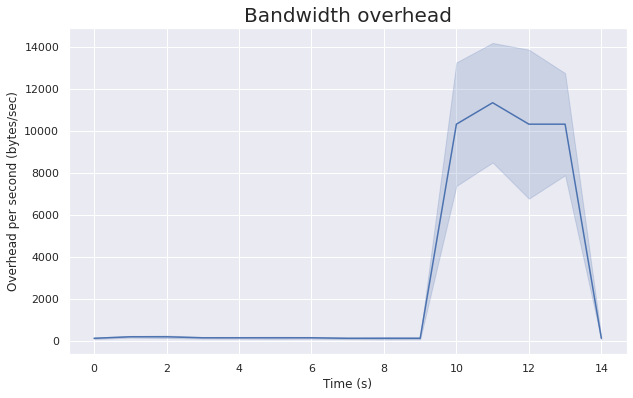

In [131]:
# The bandwidth overhead is lower in Pull-based protocol than our topology-aware Push-based gossip protocol.
bw_oh_tt_custom = get_monitor_time_table(sim_custom)
show_bandwidth_time(bw_oh_tt_custom)

bw_oh_tt_pull.mean(axis=1).mean() / bw_oh_tt_custom.mean(axis=1).mean() 

In [132]:
# Our topology-aware Push-based gossip protocol is not robust to peer downtimes, as we do see 'NaN' in the above mentioned table. That means, not all messages will be received by the peer nodes. 
# Therefore, We will go with Pull-based gossip protocol as it has low message (and bandwidth) overhead. More importantly, it is robust to peer downtimes. 